##Loading the dataset

Used color images from the BSD dataset : https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/

In [ ]:
#Mount GDrive for reading images stored in GDrive

from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
cd gdrive

/content/gdrive


In [ ]:
cd MyDrive

/content/gdrive/MyDrive


In [ ]:
cd BSDS300

/content/gdrive/MyDrive/BSDS300


In [ ]:
cd images

/content/gdrive/MyDrive/BSDS300/images


In [ ]:
# Get image names from a GDrive directory

import os
dir = 'train'
imgnames = []
for i in os.listdir(dir):
  x = os.path.join(dir,i)
  imgnames.append(x)

imgnames

['train/61060.jpg',
 'train/301007.jpg',
 'train/46076.jpg',
 'train/45077.jpg',
 'train/188091.jpg',
 'train/100075.jpg',
 'train/365025.jpg',
 'train/286092.jpg',
 'train/26031.jpg',
 'train/155060.jpg',
 'train/232038.jpg',
 'train/159029.jpg',
 'train/20008.jpg',
 'train/271008.jpg',
 'train/145053.jpg',
 'train/189003.jpg',
 'train/374020.jpg',
 'train/12003.jpg',
 'train/299091.jpg',
 'train/22093.jpg',
 'train/66075.jpg',
 'train/103041.jpg',
 'train/198054.jpg',
 'train/105053.jpg',
 'train/55075.jpg',
 'train/68077.jpg',
 'train/65074.jpg',
 'train/370036.jpg',
 'train/122048.jpg',
 'train/41004.jpg',
 'train/181079.jpg',
 'train/163014.jpg',
 'train/187039.jpg',
 'train/277095.jpg',
 'train/236017.jpg',
 'train/376020.jpg',
 'train/198023.jpg',
 'train/42044.jpg',
 'train/187029.jpg',
 'train/56028.jpg',
 'train/76002.jpg',
 'train/15088.jpg',
 'train/22090.jpg',
 'train/43083.jpg',
 'train/361084.jpg',
 'train/187071.jpg',
 'train/35058.jpg',
 'train/28096.jpg',
 'train/1380

In [ ]:
len(imgnames)

200

##Defining Noise and Blur kernels

References:
https://www.geeksforgeeks.org/opencv-motion-blur-in-python/  

https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_filtering/py_filtering.html

Defined a function **blur** which randomly selects one of the 5 blur models and applies it to the image.
Blur models include  
1) Mean blur  
2) Guassian Blur  
3) Median blur  
4) Vertical motion blur  
5) Guassian motion blur

In [ ]:
def blur(img):
  n = random.randint(0,4)
  #print(n)
  if n==0:
    n_img = cv2.blur(img,(3,3))
  if n==1:
    n_img = cv2.GaussianBlur(img,(3,3),0)
  if n==2:
    n_img = cv2.medianBlur(img,3)
  if n==3:#vertival motion blur
    kv = np.zeros((7, 7))
    kv[:,3] = np.ones(7)
    kv = kv/7
    n_img = cv2.filter2D(img, -1, kv)
  if n==4:#horizontal motion blur
    kh = np.zeros((7, 7))
    kh[3,:] = np.ones(7)
    kh = kh/7
    n_img = cv2.filter2D(img, -1, kh)
  n_img = n_img.astype(np.uint8)
  return(n_img)

References https://stackoverflow.com/questions/22937589/how-to-add-noise-gaussian-salt-and-pepper-etc-to-image-in-python-with-opencv

Defined a function noise which randomly adds one of the 3 types of noise to the image.  
Noise types used are   :-  
Guassian noise  
Salt and pepper noise

In [ ]:
 def noise(img):
  n = random.randint(0,2)
  #print(n)
  if n==0:
    x = np.random.normal(0,0.3,img.shape)
    x = x.reshape(img.shape)
    img = img + x
  if n==1:
    x = np.random.normal(0,0.5,img.shape)
    x = x.reshape(img.shape)
    img = img + x
  if n==2:
    (i1,i2,i3) = img.shape
    #print(i1,i2,i3)
    k = int(i1*i2*i3*0.001)
    for i in range(k):
      x = random.randint(0,i1-1)
      y = random.randint(0,i2-1)
      z = random.randint(0,i3-1)
      #print(x,y,z)
      img[x][y][z] = 255
      x = random.randint(0,i1-1)
      y = random.randint(0,i2-1)
      z = random.randint(0,i3-1)
      #print(x,y,z)
      img[x][y][z] = 0
  img = img.astype(np.uint8)
  return(img)


###Visualizing the affect of kernels on Training Data

In [ ]:
import random
import numpy as np

(481, 321, 3)


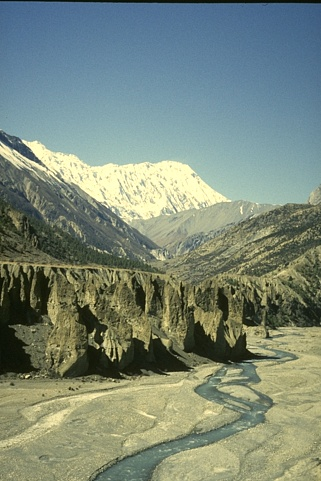

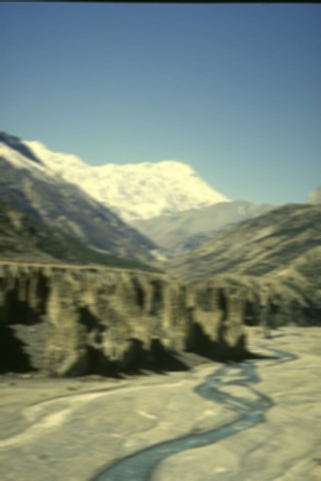

In [ ]:
# Read one image and display it

import cv2
from google.colab.patches import cv2_imshow

n = 45 # nth image in the directory will be read

img = cv2.imread(imgnames[n]) # Read image

# Display image
print(img.shape)
cv2_imshow(img)

n_img = blur(img)
n_img = noise(n_img)
n_img = blur(n_img)
cv2_imshow(n_img)

##Preparing Training Dataset

In [ ]:
x=[]
for i in imgnames:
  img = cv2.imread(i)
  x.append(img.shape)
print(set(x))

{(321, 481, 3), (481, 321, 3)}


In [ ]:
size = set(x)
size

{(321, 481, 3), (481, 321, 3)}

In [ ]:
clean = []
patches_27 = []
patches_17 = []
patches_7 = []
numPatches = 100 # Number of patches to be extracted per image
#Patch sizes used = 27,17,7

The starter code given for extracting patches was used as reference here

In [ ]:
for i in imgnames:
  img = cv2.imread(i)
  n_img = blur(img)
  n_img = noise(n_img)
  n_img = blur(n_img)
  for i in range(numPatches): # For number of patches
    w=13
    x = random.randint(w+1, n_img.shape[0]-w-1) # Random x location so that the patch 
                                            # remains within image boundaries
    y = random.randint(w+1, n_img.shape[1]-w-1) # Random y location
                                          # remains within image boundaries
    
    patches_27.append(n_img[x-w:x+w+1,y-w:y+w+1,:]) # Extract patch
    w = 8
    patches_17.append(n_img[x-w:x+w+1,y-w:y+w+1,:]) # Extract patch
    w = 3
    patches_7.append(n_img[x-w:x+w+1,y-w:y+w+1,:]) # Extract patch
    clean.append(img[x,y,:]) #Clean pixel value

Pre-processing the patches

In [ ]:
patches_27 = np.array(patches_27)
patches_17 = np.array(patches_17)
patches_7 = np.array(patches_7)
clean = np.array(clean)
print(patches_27.shape)
print(patches_17.shape)
print(patches_7.shape)
print(clean.shape)       

(20000, 27, 27, 3)
(20000, 17, 17, 3)
(20000, 7, 7, 3)
(20000, 3)


Reference : https://stackoverflow.com/questions/4601373/better-way-to-shuffle-two-numpy-arrays-in-unison

In [ ]:
id = np.arange(clean.shape[0])
np.random.shuffle(id)
patches_27 = patches_27[id]
patches_17 = patches_17[id]
patches_7 = patches_7[id]
clean = clean[id]

In [ ]:
patches_27 = patches_27.astype('float32')
patches_17 = patches_17.astype('float32')
patches_7 = patches_7.astype('float32')
clean = clean.astype('float32')

In [ ]:
patch_27 = patches_27/255
patch_17 = patches_17/255
patch_7 = patches_7/255

##Models

References : https://www.tensorflow.org/guide/keras/sequential_model

Importing required modules for defining the CNN model

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import *
from keras.layers import *
from tensorflow.keras import layers

I am trying CNN models of different depths for 3 different window sizes : 27,17 and 7

###Model0

In [ ]:
model0 = Sequential([
  layers.Conv2D(8, 3, padding='same',activation = 'relu'),
  layers.Conv2D(1, 3, padding='same',activation = 'relu'),
  layers.Flatten(),
  layers.Dense(128,activation='relu'),
  layers.Dense(64,activation='relu'),
  layers.Dropout(0.25),
  layers.Dense(32,activation='relu'),
  layers.Dropout(0.5),
  layers.Dense(3,activation='relu'),            
])

In [ ]:
model0.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model0',monitor='val_accuracy',mode='max',save_best_only=True)

In [ ]:
history27_0 = model0.fit(patches_27,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 11s 42ms/step - loss: 3754.7976 - accuracy: 0.3909 - val_loss: 926.4460 - val_accuracy: 0.6304
INFO:tensorflow:Assets written to: model0/assets
Epoch 2/25
235/235 [==============================] - 9s 40ms/step - loss: 2508.1353 - accuracy: 0.4699 - val_loss: 809.3469 - val_accuracy: 0.6450
INFO:tensorflow:Assets written to: model0/assets
Epoch 3/25
235/235 [==============================] - 10s 41ms/step - loss: 2034.7314 - accuracy: 0.4845 - val_loss: 927.5069 - val_accuracy: 0.6534
INFO:tensorflow:Assets written to: model0/assets
Epoch 4/25
235/235 [==============================] - 10s 41ms/step - loss: 1810.4753 - accuracy: 0.5083 - val_loss: 591.2236 - val_accuracy: 0.6270
Epoch 5/25
235/235 [==============================] - 10s 42ms/step - loss: 1603.1530 - accuracy: 0.5265 - val_loss: 661.2346 - val_accuracy: 0.6560
INFO:tensorflow:Assets written to: model0/assets
Epoch 6/25
235/235 [==============================] - 10s 42

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model01',monitor='val_accuracy',mode='max',save_best_only=True)

In [ ]:
history17_0 = model0.fit(patches_17,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 5s 20ms/step - loss: 4085.8025 - accuracy: 0.4409 - val_loss: 1171.7012 - val_accuracy: 0.5274
INFO:tensorflow:Assets written to: model01/assets
Epoch 2/25
235/235 [==============================] - 5s 20ms/step - loss: 2176.2781 - accuracy: 0.5135 - val_loss: 733.2162 - val_accuracy: 0.6320
INFO:tensorflow:Assets written to: model01/assets
Epoch 3/25
235/235 [==============================] - 5s 19ms/step - loss: 1879.8845 - accuracy: 0.5293 - val_loss: 721.1436 - val_accuracy: 0.6406
INFO:tensorflow:Assets written to: model01/assets
Epoch 4/25
235/235 [==============================] - 5s 19ms/step - loss: 1726.5825 - accuracy: 0.5445 - val_loss: 479.4347 - val_accuracy: 0.6594
INFO:tensorflow:Assets written to: model01/assets
Epoch 5/25
235/235 [==============================] - 5s 19ms/step - loss: 1572.7518 - accuracy: 0.5479 - val_loss: 749.9283 - val_accuracy: 0.6036
Epoch 6/25
235/235 [==============================] - 5s 19

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model02',monitor='val_accuracy',mode='max',save_best_only=True)

In [ ]:
history7_0 = model0.fit(patches_7,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 2s 7ms/step - loss: 3922.8154 - accuracy: 0.3635 - val_loss: 742.5175 - val_accuracy: 0.6214
INFO:tensorflow:Assets written to: model02/assets
Epoch 2/25
235/235 [==============================] - 2s 7ms/step - loss: 1991.4637 - accuracy: 0.4933 - val_loss: 579.0068 - val_accuracy: 0.8016
INFO:tensorflow:Assets written to: model02/assets
Epoch 3/25
235/235 [==============================] - 2s 7ms/step - loss: 1777.8855 - accuracy: 0.5434 - val_loss: 465.9709 - val_accuracy: 0.7684
Epoch 4/25
235/235 [==============================] - 2s 7ms/step - loss: 1609.2375 - accuracy: 0.5774 - val_loss: 504.8766 - val_accuracy: 0.7854
Epoch 5/25
235/235 [==============================] - 1s 6ms/step - loss: 1563.1672 - accuracy: 0.5931 - val_loss: 428.6241 - val_accuracy: 0.7858
Epoch 6/25
235/235 [==============================] - 1s 6ms/step - loss: 1434.5942 - accuracy: 0.6025 - val_loss: 471.4951 - val_accuracy: 0.7662
Epoch 7/25
235/235

Since I felt the model was underfitting I increased the depth of the model

###Model1

In [ ]:
model1 = Sequential([
  layers.Conv2D(8, 3, padding='same',activation = 'relu'),
  layers.Conv2D(16, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(16, 3, padding='same',activation = 'relu'),
  layers.Conv2D(8, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128,activation='relu'),
  layers.Dense(64,activation='relu'),
  layers.Dropout(0.25),
  layers.Dense(32,activation='relu'),
  layers.Dropout(0.5),
  layers.Dense(3,activation='relu'),            
])

model1.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model10',monitor='val_accuracy',mode='max',save_best_only=True)

In [ ]:
history27_1 = model1.fit(patches_27,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 18s 73ms/step - loss: 4183.0464 - accuracy: 0.4087 - val_loss: 1208.1307 - val_accuracy: 0.6696
INFO:tensorflow:Assets written to: model10/assets
Epoch 2/25
235/235 [==============================] - 18s 77ms/step - loss: 2447.6282 - accuracy: 0.4759 - val_loss: 1351.1617 - val_accuracy: 0.6508
Epoch 3/25
235/235 [==============================] - 18s 78ms/step - loss: 2002.6295 - accuracy: 0.4869 - val_loss: 1572.7458 - val_accuracy: 0.6088
Epoch 4/25
235/235 [==============================] - 18s 78ms/step - loss: 1775.0587 - accuracy: 0.5168 - val_loss: 563.1047 - val_accuracy: 0.6288
Epoch 5/25
235/235 [==============================] - 18s 78ms/step - loss: 1633.1215 - accuracy: 0.5295 - val_loss: 568.4387 - val_accuracy: 0.6144
Epoch 6/25
235/235 [==============================] - 18s 78ms/step - loss: 1589.8643 - accuracy: 0.5565 - val_loss: 669.5983 - val_accuracy: 0.5866
Epoch 7/25
235/235 [==============================] -

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model11',monitor='val_accuracy',mode='max',save_best_only=True)
history17_1 = model1.fit(patches_17,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 10s 40ms/step - loss: 3816.4026 - accuracy: 0.3856 - val_loss: 627.2496 - val_accuracy: 0.6208
INFO:tensorflow:Assets written to: model11/assets
Epoch 2/25
235/235 [==============================] - 9s 38ms/step - loss: 2213.1926 - accuracy: 0.4639 - val_loss: 499.7862 - val_accuracy: 0.6334
INFO:tensorflow:Assets written to: model11/assets
Epoch 3/25
235/235 [==============================] - 8s 35ms/step - loss: 1681.7368 - accuracy: 0.5166 - val_loss: 487.5934 - val_accuracy: 0.6092
Epoch 4/25
235/235 [==============================] - 8s 35ms/step - loss: 1539.4033 - accuracy: 0.5379 - val_loss: 461.2235 - val_accuracy: 0.6680
INFO:tensorflow:Assets written to: model11/assets
Epoch 5/25
235/235 [==============================] - 8s 35ms/step - loss: 1447.7980 - accuracy: 0.5565 - val_loss: 448.5730 - val_accuracy: 0.6340
Epoch 6/25
235/235 [==============================] - 8s 35ms/step - loss: 1407.9711 - accuracy: 0.5539 - val

In [ ]:
model1 = Sequential([
  layers.Conv2D(8, 3, padding='same',activation = 'relu'),
  layers.Conv2D(8, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(16, 3, padding='same',activation = 'relu'),
  layers.Conv2D(16, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(64,activation='relu'),
  layers.Dense(16,activation='relu'),
  layers.Dense(3,activation='relu'),            
])

model1.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model12',monitor='val_accuracy',mode='max',save_best_only=True)
history7_2 = model1.fit(patches_7,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 3s 11ms/step - loss: 4079.5295 - accuracy: 0.5500 - val_loss: 428.8029 - val_accuracy: 0.7198
INFO:tensorflow:Assets written to: model12/assets
Epoch 2/25
235/235 [==============================] - 2s 10ms/step - loss: 346.1029 - accuracy: 0.7161 - val_loss: 309.5945 - val_accuracy: 0.7318
INFO:tensorflow:Assets written to: model12/assets
Epoch 3/25
235/235 [==============================] - 2s 10ms/step - loss: 279.3174 - accuracy: 0.7904 - val_loss: 241.3566 - val_accuracy: 0.8994
INFO:tensorflow:Assets written to: model12/assets
Epoch 4/25
235/235 [==============================] - 2s 10ms/step - loss: 235.5471 - accuracy: 0.8998 - val_loss: 234.9418 - val_accuracy: 0.9170
INFO:tensorflow:Assets written to: model12/assets
Epoch 5/25
235/235 [==============================] - 2s 10ms/step - loss: 234.8677 - accuracy: 0.9089 - val_loss: 235.4478 - val_accuracy: 0.9116
Epoch 6/25
235/235 [==============================] - 2s 10ms/st

I still felt the model was underfitting especially for patch size 27 and 17 hence I decided to remove the dropout layers

###Model2

In [ ]:
model2 = Sequential([
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same',activation = 'relu'),
  layers.Conv2D(128, 1, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(64,activation='relu'),
  layers.Dense(32,activation='relu'),
  layers.Dense(16,activation='relu'),
  layers.Dense(3,activation='relu'),            
])

model2.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model20',monitor='val_accuracy',mode='max',save_best_only=True)
history27_0 = model2.fit(patches_27,clean,batch_size=64, epochs=25,validation_split=0.3,callbacks=checkpoint)

Epoch 1/25
219/219 [==============================] - 61s 277ms/step - loss: 1755.9429 - accuracy: 0.4840 - val_loss: 684.1661 - val_accuracy: 0.6868
INFO:tensorflow:Assets written to: model20/assets
Epoch 2/25
219/219 [==============================] - 61s 278ms/step - loss: 611.4824 - accuracy: 0.6554 - val_loss: 492.6397 - val_accuracy: 0.6893
INFO:tensorflow:Assets written to: model20/assets
Epoch 3/25
219/219 [==============================] - 61s 278ms/step - loss: 472.4934 - accuracy: 0.7424 - val_loss: 448.7470 - val_accuracy: 0.8387
INFO:tensorflow:Assets written to: model20/assets
Epoch 4/25
219/219 [==============================] - 61s 277ms/step - loss: 372.7680 - accuracy: 0.8316 - val_loss: 348.2157 - val_accuracy: 0.8558
INFO:tensorflow:Assets written to: model20/assets
Epoch 5/25
219/219 [==============================] - 61s 277ms/step - loss: 342.0826 - accuracy: 0.8351 - val_loss: 328.3793 - val_accuracy: 0.8285
Epoch 6/25
219/219 [==============================] - 

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model21',monitor='val_accuracy',mode='max',save_best_only=True)
history17_0 = model2.fit(patches_17,clean,batch_size=64, epochs=25,validation_split=0.3,callbacks=checkpoint)

Epoch 1/25
219/219 [==============================] - 26s 118ms/step - loss: 5933.3232 - accuracy: 0.5690 - val_loss: 5902.8042 - val_accuracy: 0.6050
INFO:tensorflow:Assets written to: model21/assets
Epoch 2/25
219/219 [==============================] - 26s 117ms/step - loss: 5658.6069 - accuracy: 0.6060 - val_loss: 5605.9448 - val_accuracy: 0.6133
INFO:tensorflow:Assets written to: model21/assets
Epoch 3/25
219/219 [==============================] - 26s 117ms/step - loss: 5630.8076 - accuracy: 0.6066 - val_loss: 5623.7593 - val_accuracy: 0.6140
INFO:tensorflow:Assets written to: model21/assets
Epoch 4/25
219/219 [==============================] - 25s 116ms/step - loss: 5608.3394 - accuracy: 0.6105 - val_loss: 5595.7588 - val_accuracy: 0.6143
INFO:tensorflow:Assets written to: model21/assets
Epoch 5/25
219/219 [==============================] - 26s 117ms/step - loss: 5607.4263 - accuracy: 0.6098 - val_loss: 5581.4868 - val_accuracy: 0.6143
Epoch 6/25
219/219 [=========================

In [ ]:
model2 = Sequential([
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(32,activation='relu'),
  layers.Dense(16,activation='relu'),
  layers.Dense(8,activation='relu'),
  layers.Dense(3,activation='relu'),            
])

model2.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model22',monitor='val_accuracy',mode='max',save_best_only=True)
history7_0 = model2.fit(patches_7,clean,batch_size=64, epochs=25,validation_split=0.3,callbacks=checkpoint)

Epoch 1/25
219/219 [==============================] - 5s 22ms/step - loss: 9940.2041 - accuracy: 0.4077 - val_loss: 9676.2764 - val_accuracy: 0.4062
INFO:tensorflow:Assets written to: model22/assets
Epoch 2/25
219/219 [==============================] - 5s 22ms/step - loss: 9693.6807 - accuracy: 0.4101 - val_loss: 9649.3281 - val_accuracy: 0.4073
INFO:tensorflow:Assets written to: model22/assets
Epoch 3/25
219/219 [==============================] - 5s 22ms/step - loss: 9687.8740 - accuracy: 0.4105 - val_loss: 9649.4814 - val_accuracy: 0.4068
Epoch 4/25
219/219 [==============================] - 5s 22ms/step - loss: 9684.2930 - accuracy: 0.4091 - val_loss: 9648.3965 - val_accuracy: 0.4072
Epoch 5/25
219/219 [==============================] - 5s 22ms/step - loss: 9684.9785 - accuracy: 0.4099 - val_loss: 9650.4062 - val_accuracy: 0.4057
Epoch 6/25
219/219 [==============================] - 5s 22ms/step - loss: 9684.1992 - accuracy: 0.4096 - val_loss: 9646.7764 - val_accuracy: 0.4073
Epoch 

The accuracies wereimproving but still below 90% so I decided to experiment more by increasing depth

###Model3


In [ ]:
model3 = Sequential([
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same',activation = 'relu'),
  layers.Conv2D(128, 1, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128,activation='relu'),
  layers.Dense(64,activation='relu'),
  layers.Dense(32,activation='relu'),
  layers.Dense(16,activation='relu'),
  layers.Dense(8,activation='relu'),
  layers.Dense(3,activation='relu'),            
])
model3.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model30',monitor='val_accuracy',mode='max',save_best_only=True)
history27_3 = model3.fit(patches_27,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 65s 274ms/step - loss: 1040.3475 - accuracy: 0.5739 - val_loss: 591.7947 - val_accuracy: 0.6902
INFO:tensorflow:Assets written to: model30/assets
Epoch 2/25
235/235 [==============================] - 64s 274ms/step - loss: 509.6455 - accuracy: 0.6749 - val_loss: 468.6729 - val_accuracy: 0.6878
Epoch 3/25
235/235 [==============================] - 64s 273ms/step - loss: 475.4297 - accuracy: 0.6779 - val_loss: 580.3877 - val_accuracy: 0.7062
INFO:tensorflow:Assets written to: model30/assets
Epoch 4/25
235/235 [==============================] - 64s 273ms/step - loss: 418.3119 - accuracy: 0.6934 - val_loss: 392.2588 - val_accuracy: 0.6968
Epoch 5/25
235/235 [==============================] - 64s 273ms/step - loss: 355.5815 - accuracy: 0.7216 - val_loss: 389.1927 - val_accuracy: 0.7936
INFO:tensorflow:Assets written to: model30/assets
Epoch 6/25
235/235 [==============================] - 64s 272ms/step - loss: 326.9008 - accuracy: 0.7973

In [ ]:
model3 = Sequential([
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same',activation = 'relu'),
  layers.Conv2D(128, 1, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128,activation='relu'),
  layers.Dense(64,activation='relu'),
  layers.Dense(32,activation='relu'),
  layers.Dense(16,activation='relu'),
  layers.Dense(3,activation='relu'),            
])
model3.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'mode3l',monitor='val_accuracy',mode='max',save_best_only=True)
history17_3 = model3.fit(patches_17,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 29s 119ms/step - loss: 2761.2910 - accuracy: 0.5417 - val_loss: 586.1255 - val_accuracy: 0.8066
INFO:tensorflow:Assets written to: mode3l/assets
Epoch 2/25
235/235 [==============================] - 27s 116ms/step - loss: 382.2390 - accuracy: 0.8521 - val_loss: 312.2284 - val_accuracy: 0.9066
INFO:tensorflow:Assets written to: mode3l/assets
Epoch 3/25
235/235 [==============================] - 27s 113ms/step - loss: 302.9359 - accuracy: 0.8737 - val_loss: 320.0122 - val_accuracy: 0.8836
Epoch 4/25
235/235 [==============================] - 27s 113ms/step - loss: 290.4257 - accuracy: 0.8590 - val_loss: 262.0804 - val_accuracy: 0.8824
Epoch 5/25
235/235 [==============================] - 27s 113ms/step - loss: 269.1003 - accuracy: 0.8778 - val_loss: 266.2680 - val_accuracy: 0.8786
Epoch 6/25
235/235 [==============================] - 27s 113ms/step - loss: 249.1134 - accuracy: 0.8799 - val_loss: 262.0236 - val_accuracy: 0.9046
Epoch 7

In [ ]:
model3 = Sequential([
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(32,activation='relu'),
  layers.Dense(16,activation='relu'),
  layers.Dense(8,activation='relu'),
  layers.Dense(3,activation='relu'),            
])

model3.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model32',monitor='val_accuracy',mode='max',save_best_only=True)
history7_3 = model3.fit(patches_7,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 6s 22ms/step - loss: 8161.3706 - accuracy: 0.4464 - val_loss: 470.5606 - val_accuracy: 0.6732
INFO:tensorflow:Assets written to: model32/assets
Epoch 2/25
235/235 [==============================] - 5s 22ms/step - loss: 365.6801 - accuracy: 0.7001 - val_loss: 301.0645 - val_accuracy: 0.7884
INFO:tensorflow:Assets written to: model32/assets
Epoch 3/25
235/235 [==============================] - 5s 22ms/step - loss: 272.0611 - accuracy: 0.8416 - val_loss: 301.0916 - val_accuracy: 0.7982
INFO:tensorflow:Assets written to: model32/assets
Epoch 4/25
235/235 [==============================] - 5s 23ms/step - loss: 238.3875 - accuracy: 0.9009 - val_loss: 249.5843 - val_accuracy: 0.9004
INFO:tensorflow:Assets written to: model32/assets
Epoch 5/25
235/235 [==============================] - 5s 22ms/step - loss: 228.2326 - accuracy: 0.8989 - val_loss: 232.5679 - val_accuracy: 0.9200
INFO:tensorflow:Assets written to: model32/assets
Epoch 6/25
235

Achieved accuracies above 90% , tried more models to try to improve accuracy but these gave the best.

###Model4



In [ ]:
model4 = Sequential([
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same',activation = 'relu'),
  layers.Conv2D(128, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(256, 3, padding='same',activation = 'relu'),
  layers.Conv2D(256, 1, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128,activation='relu'),
  layers.Dense(64,activation='relu'),
  layers.Dense(32,activation='relu'),
  layers.Dense(8,activation='relu'),
  layers.Dense(3,activation='relu'),            
])
model4.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model40',monitor='val_accuracy',mode='max',save_best_only=True)
history27_4 = model4.fit(patches_27,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model40',monitor='val_accuracy',mode='max',save_best_only=True)
history27_4 = model4.fit(patches_27,clean,batch_size=64, epochs=10,validation_split=0.25,callbacks=checkpoint)

Epoch 1/10
235/235 [==============================] - 114s 485ms/step - loss: 189.5110 - accuracy: 0.8666 - val_loss: 288.4041 - val_accuracy: 0.8614
Epoch 2/10
235/235 [==============================] - 114s 486ms/step - loss: 178.6459 - accuracy: 0.8718 - val_loss: 273.9882 - val_accuracy: 0.8868
INFO:tensorflow:Assets written to: model40/assets
Epoch 3/10
235/235 [==============================] - 115s 488ms/step - loss: 165.8712 - accuracy: 0.8762 - val_loss: 291.1039 - val_accuracy: 0.8622
Epoch 4/10
235/235 [==============================] - 114s 485ms/step - loss: 172.6664 - accuracy: 0.8729 - val_loss: 394.2056 - val_accuracy: 0.8534
Epoch 5/10
235/235 [==============================] - 114s 484ms/step - loss: 169.3296 - accuracy: 0.8692 - val_loss: 296.6763 - val_accuracy: 0.8892
INFO:tensorflow:Assets written to: model40/assets
Epoch 6/10
235/235 [==============================] - 114s 484ms/step - loss: 158.1313 - accuracy: 0.8739 - val_loss: 270.0111 - val_accuracy: 0.8886


Tried increasing the depth further for model of window size 27 but the accuracy did not improve

###Model5


In [ ]:
model5 = Sequential([
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same',activation = 'relu'),
  layers.Conv2D(128, 1, padding='same',activation = 'relu'),
  layers.BatchNormalization(),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128,activation='relu'),
  layers.Dense(64,activation='relu'),
  layers.Dense(32,activation='relu'),
  layers.Dense(16,activation='relu'),
  layers.Dense(8,activation='relu'),
  layers.Dense(3,activation='relu'),            
])
model5.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model50',monitor='val_accuracy',mode='max',save_best_only=True)
history27_5 = model5.fit(patches_27,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 75s 313ms/step - loss: 6741.2080 - accuracy: 0.4035 - val_loss: 7094.3257 - val_accuracy: 0.4424
INFO:tensorflow:Assets written to: model50/assets
Epoch 2/25
235/235 [==============================] - 73s 311ms/step - loss: 1666.7343 - accuracy: 0.5189 - val_loss: 1490.1676 - val_accuracy: 0.6448
INFO:tensorflow:Assets written to: model50/assets
Epoch 3/25
235/235 [==============================] - 73s 311ms/step - loss: 513.5486 - accuracy: 0.6601 - val_loss: 924.9989 - val_accuracy: 0.6252
Epoch 4/25
235/235 [==============================] - 72s 308ms/step - loss: 425.9264 - accuracy: 0.6868 - val_loss: 578.7985 - val_accuracy: 0.6390
Epoch 5/25
235/235 [==============================] - 73s 312ms/step - loss: 409.3366 - accuracy: 0.7131 - val_loss: 671.9120 - val_accuracy: 0.6678
INFO:tensorflow:Assets written to: model50/assets
Epoch 6/25
235/235 [==============================] - 73s 313ms/step - loss: 400.5522 - accuracy: 0.7

In [ ]:
model51 = Sequential([
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same',activation = 'relu'),
  layers.Conv2D(128, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128,activation='relu'),
  layers.Dense(64,activation='relu'),
  layers.Dense(32,activation='relu'),
  layers.Dense(16,activation='relu'),
  layers.Dense(8,activation='relu'),
  layers.Dense(3,activation='relu'),            
])
model51.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'mode5l',monitor='val_accuracy',mode='max',save_best_only=True)
history17_5 = model51.fit(patches_17,clean,batch_size=64, epochs=20,validation_split=0.25,callbacks=checkpoint)

Epoch 1/20
235/235 [==============================] - 75s 313ms/step - loss: 4809.5005 - accuracy: 0.5377 - val_loss: 4466.7026 - val_accuracy: 0.6344
INFO:tensorflow:Assets written to: mode5l/assets
Epoch 2/20
235/235 [==============================] - 73s 311ms/step - loss: 4501.6064 - accuracy: 0.6783 - val_loss: 4352.0879 - val_accuracy: 0.6828
INFO:tensorflow:Assets written to: mode5l/assets
Epoch 3/20
235/235 [==============================] - 73s 310ms/step - loss: 4466.7734 - accuracy: 0.6986 - val_loss: 4346.6743 - val_accuracy: 0.7178
INFO:tensorflow:Assets written to: mode5l/assets
Epoch 4/20
235/235 [==============================] - 73s 310ms/step - loss: 4423.0928 - accuracy: 0.7283 - val_loss: 4352.4668 - val_accuracy: 0.7472
INFO:tensorflow:Assets written to: mode5l/assets
Epoch 5/20
235/235 [==============================] - 73s 310ms/step - loss: 4420.3867 - accuracy: 0.7319 - val_loss: 4446.1802 - val_accuracy: 0.7412
Epoch 6/20
235/235 [=============================

In [ ]:
model52 = Sequential([
  layers.Conv2D(32, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(128, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.Conv2D(64, 3, padding='same',activation = 'relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128,activation='relu'),
  layers.Dense(64,activation='relu'),
  layers.Dense(32,activation='relu'),
  layers.Dense(16,activation='relu'),
  layers.Dense(8,activation='relu'),
  layers.Dense(3,activation='relu'),            
])

model52.compile(optimizer='adam',loss='mean_squared_error',metrics=['accuracy'])

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'model52',monitor='val_accuracy',mode='max',save_best_only=True)
history7_5 = model52.fit(patches_7,clean,batch_size=64, epochs=25,validation_split=0.25,callbacks=checkpoint)

Epoch 1/25
235/235 [==============================] - 31s 128ms/step - loss: 6037.9570 - accuracy: 0.3631 - val_loss: 5887.8716 - val_accuracy: 0.3770
INFO:tensorflow:Assets written to: model52/assets
Epoch 2/25
235/235 [==============================] - 29s 125ms/step - loss: 5743.2700 - accuracy: 0.4463 - val_loss: 5723.0312 - val_accuracy: 0.5418
INFO:tensorflow:Assets written to: model52/assets
Epoch 3/25
235/235 [==============================] - 30s 127ms/step - loss: 5637.4575 - accuracy: 0.5450 - val_loss: 5774.4756 - val_accuracy: 0.5426
INFO:tensorflow:Assets written to: model52/assets
Epoch 4/25
235/235 [==============================] - 30s 128ms/step - loss: 5643.5483 - accuracy: 0.5378 - val_loss: 5693.6011 - val_accuracy: 0.5580
INFO:tensorflow:Assets written to: model52/assets
Epoch 5/25
235/235 [==============================] - 30s 127ms/step - loss: 5619.3691 - accuracy: 0.5572 - val_loss: 5784.2798 - val_accuracy: 0.5556
Epoch 6/25
235/235 [=========================

Added batch normalization but that did not improve accuracies

##Model Summary


Selected 3 models in total,  
m_27 :  
 > window size = 27  
 > Training accuracy = 88.48%  
 > Validation accuracy = 90.68% 

m_17 :  
 > window size = 17  
 > Training accuracy = 89.21%  
 > Validation accuracy = 92.16%  

m_7 :  
 > window size = 7  
 > Training accuracy = 92.01%  
 > Validation accuracy = 94.16%


In [ ]:
m_27 = keras.models.load_model('model30')

In [ ]:
m_27.summary()

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_79 (Conv2D)           (None, 27, 27, 32)        896       
_________________________________________________________________
conv2d_80 (Conv2D)           (None, 27, 27, 32)        9248      
_________________________________________________________________
max_pooling2d_39 (MaxPooling (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_81 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
conv2d_82 (Conv2D)           (None, 13, 13, 64)        36928     
_________________________________________________________________
max_pooling2d_40 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_83 (Conv2D)           (None, 6, 6, 128)       

In [ ]:
m_17 = keras.models.load_model('mode3l')

In [ ]:
m_17.summary()

Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_112 (Conv2D)          (None, 17, 17, 32)        896       
_________________________________________________________________
conv2d_113 (Conv2D)          (None, 17, 17, 32)        9248      
_________________________________________________________________
max_pooling2d_56 (MaxPooling (None, 8, 8, 32)          0         
_________________________________________________________________
conv2d_114 (Conv2D)          (None, 8, 8, 64)          18496     
_________________________________________________________________
conv2d_115 (Conv2D)          (None, 8, 8, 64)          36928     
_________________________________________________________________
max_pooling2d_57 (MaxPooling (None, 4, 4, 64)          0         
_________________________________________________________________
conv2d_116 (Conv2D)          (None, 4, 4, 128)       

In [ ]:
m_7 = keras.models.load_model('model32')

In [ ]:
m_7.summary()

Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_118 (Conv2D)          (None, 7, 7, 32)          896       
_________________________________________________________________
conv2d_119 (Conv2D)          (None, 7, 7, 32)          9248      
_________________________________________________________________
max_pooling2d_59 (MaxPooling (None, 3, 3, 32)          0         
_________________________________________________________________
conv2d_120 (Conv2D)          (None, 3, 3, 64)          18496     
_________________________________________________________________
conv2d_121 (Conv2D)          (None, 3, 3, 64)          36928     
_________________________________________________________________
max_pooling2d_60 (MaxPooling (None, 1, 1, 64)          0         
_________________________________________________________________
flatten_24 (Flatten)         (None, 64)              

##Testing

###Function definitions

Defining functions in order to predict clean images from degraded ones.   
3 functions : predict0, predict1, predict2 one for each window size.  
predict0 for window size 27  
predict1 for window size 17  
predict2 for window size 7

In [ ]:
def predict0(img):
  (i1,i2,i3) = img.shape
  img = np.array(img)
  img = np.pad(img, ((13, 13), (13,13),(0,0)), 'edge') #Adding padding so that output image size is same as input image
  out = np.zeros((i1,i2,3))
  test = []
  #Extracting Patches...
  for x in range(i1):
    for y in range(i2):
      test.append(img[x:x+27,y:y+27,:])
  test = np.array(test)
  test = test.astype('float32')
  #Predicting using the model...
  pred = m_27.predict(test)
  pred = np.array(pred)
  pred = pred.astype(np.uint8)
  out = pred.reshape((i1,i2,i3))
  out = np.uint8(np.clip(out,0,255))
  return(out)

In [ ]:
def predict1(img):
  (i1,i2,i3) = img.shape
  image = np.array(img)
  img = np.pad(image, ((8, 8), (8,8),(0,0)), 'edge') #Adding padding so that output image size is same as input image
  out = np.zeros((i1,i2,3))
  test = []
  #Extracting Patches...
  for x in range(i1):
    for y in range(i2):
      test.append(img[x:x+17,y:y+17,:])
  test = np.array(test)
  test = test.astype('float32')
  #Predicting...
  pred = m_17.predict(test)
  pred = np.array(pred)
  pred = pred.astype(np.uint8)
  out = pred.reshape((i1,i2,i3))
  out = np.uint8(np.clip(out,0,255))
  #print('Done!')
  return(out)

In [ ]:
def predict2(img):
  (i1,i2,i3) = img.shape
  image = np.array(img)
  img = np.pad(image, ((3, 3), (3,3),(0,0)), 'edge')#Adding padding so that output image size is same as input image
  test = []
  #Extracting Patches...
  for x in range(i1):
    for y in range(i2):
      test.append(img[x:x+7,y:y+7,:])
  test = np.array(test)
  test = test.astype('float32')
  #Predicting...
  pred = m_7.predict(test)
  pred = np.array(pred)
  out = pred.reshape((i1,i2,i3))
  out = np.uint8(np.clip(out,0,255))
  return(out)

###Predictions

####Training Images

Images from which patches were taken  

In [ ]:
def test(n):
  img = cv2.imread(imgnames[n]) # Read image
#artificially blurring image similar to how it was done for training
  n_img = blur(img)
  n_img = noise(n_img)
  n_img = blur(n_img)
#displaying orignal and blurred image
  print('Orignal Image | Degraded Image')
  r_img = np.concatenate((img, n_img), axis=1)
  cv2_imshow(r_img)
#Predicting using the 3 models
  print("Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3")
  c_img0 = predict0(n_img)
  c_img1 = predict1(n_img)
  c_img2 = predict2(n_img)
  c_img = np.concatenate((c_img0, c_img1, c_img2), axis=1)
  cv2_imshow(c_img)
  return

Orignal Image | Degraded Image


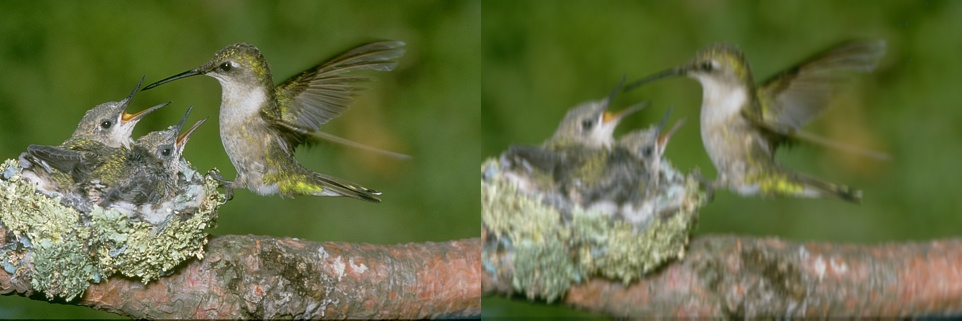

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


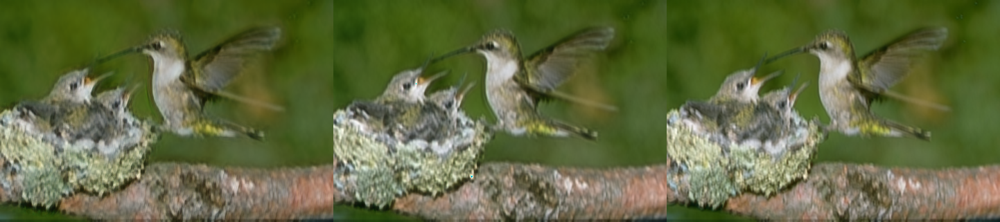

Orignal Image | Degraded Image


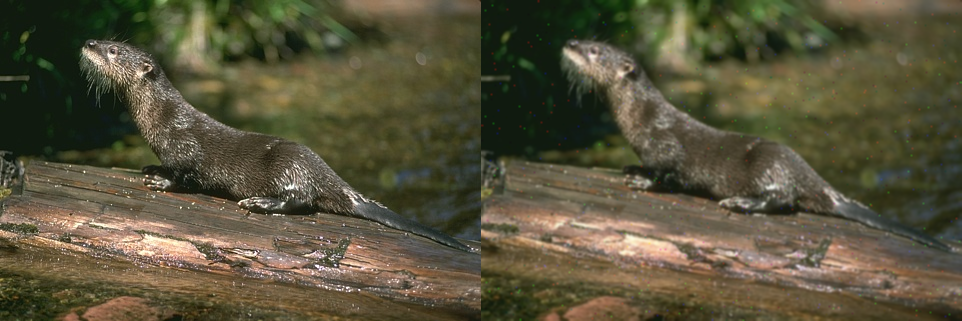

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


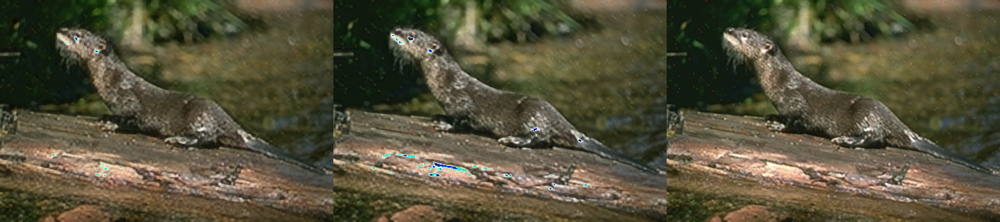

Orignal Image | Degraded Image


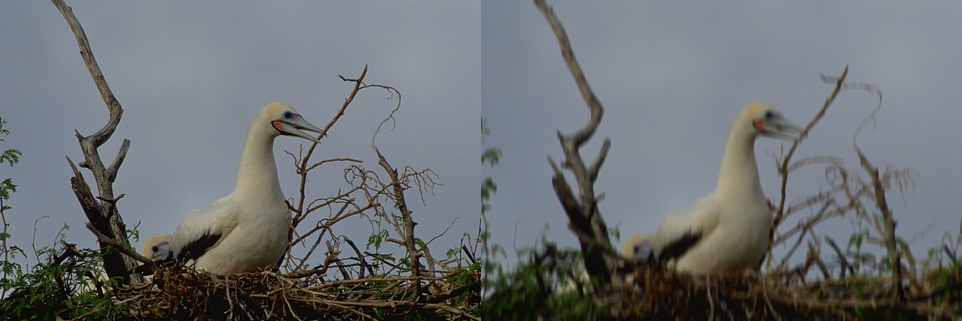

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


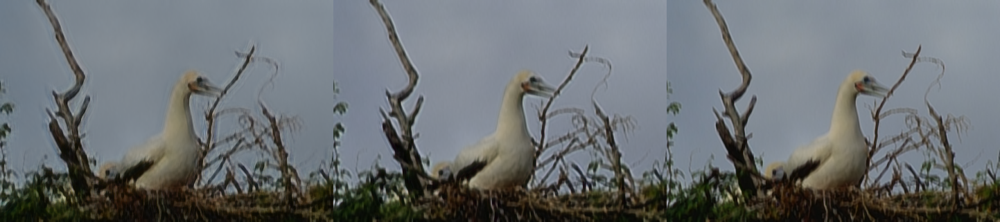

Orignal Image | Degraded Image


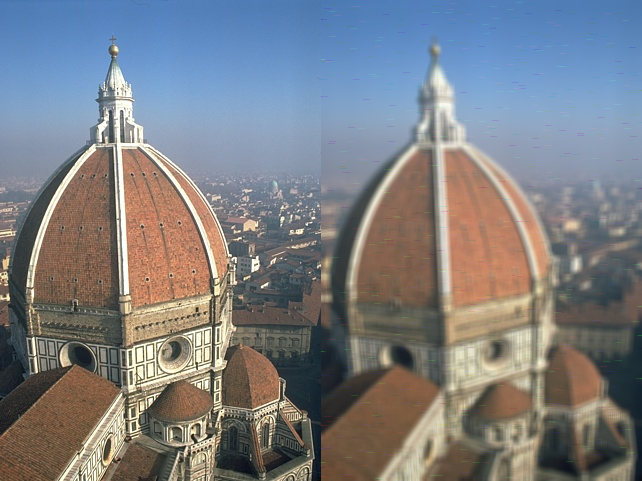

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


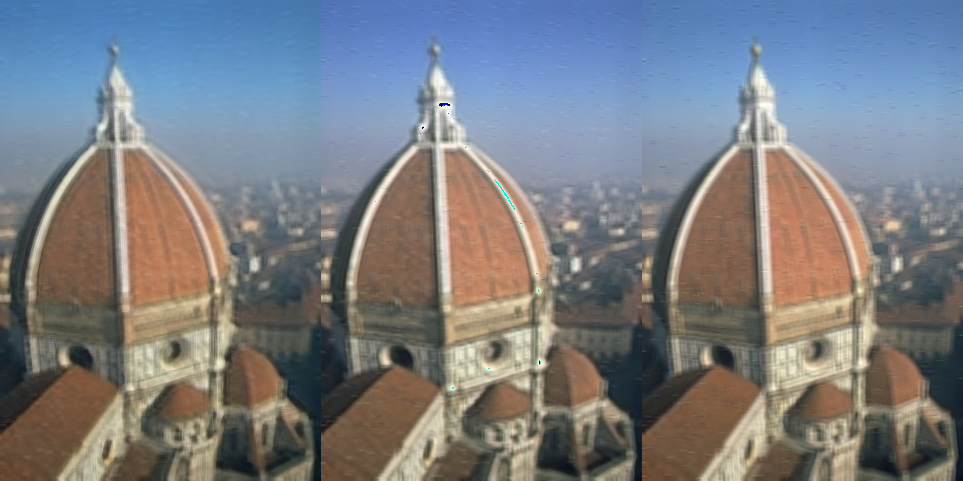

Orignal Image | Degraded Image


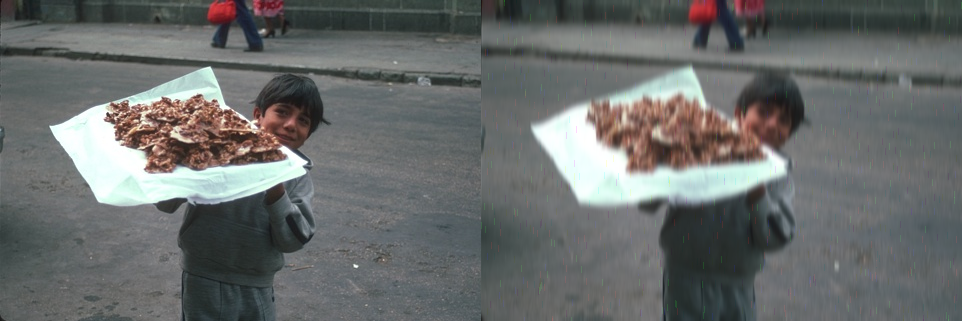

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


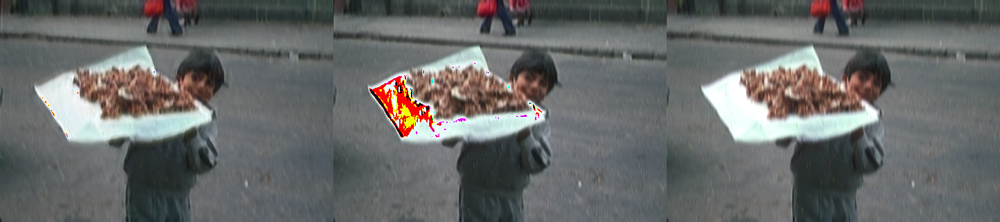

In [ ]:
for n in np.random.randint(200, size=(5)): # nth image in the directory will be read
  test(n)

####Test Images


Completely new images, not use for training

In [ ]:
# Get image names from a GDrive directory

import os
dir = 'test'
t_imgn = []
for i in os.listdir(dir):
  x = os.path.join(dir,i)
  t_imgn.append(x)

t_imgn

['test/103070.jpg',
 'test/295087.jpg',
 'test/8023.jpg',
 'test/157055.jpg',
 'test/78004.jpg',
 'test/45096.jpg',
 'test/16077.jpg',
 'test/43074.jpg',
 'test/38092.jpg',
 'test/167062.jpg',
 'test/76053.jpg',
 'test/119082.jpg',
 'test/304034.jpg',
 'test/219090.jpg',
 'test/260058.jpg',
 'test/253027.jpg',
 'test/86000.jpg',
 'test/86016.jpg',
 'test/24077.jpg',
 'test/101085.jpg',
 'test/42049.jpg',
 'test/300091.jpg',
 'test/220075.jpg',
 'test/156065.jpg',
 'test/58060.jpg',
 'test/291000.jpg',
 'test/296007.jpg',
 'test/126007.jpg',
 'test/170057.jpg',
 'test/175032.jpg',
 'test/89072.jpg',
 'test/163085.jpg',
 'test/41033.jpg',
 'test/109053.jpg',
 'test/148026.jpg',
 'test/167083.jpg',
 'test/108082.jpg',
 'test/86068.jpg',
 'test/54082.jpg',
 'test/216081.jpg',
 'test/3096.jpg',
 'test/271035.jpg',
 'test/227092.jpg',
 'test/148089.jpg',
 'test/97033.jpg',
 'test/223061.jpg',
 'test/69040.jpg',
 'test/210088.jpg',
 'test/241004.jpg',
 'test/182053.jpg',
 'test/147091.jpg',
 

In [ ]:
def test(n):
  img = cv2.imread(t_imgn[n]) # Read image
#artificially blurring image similar to how it was done for training
  n_img = blur(img)
  n_img = noise(n_img)
  n_img = blur(n_img)
#displaying orignal and blurred image
  print('Orignal Image | Degraded Image')
  r_img = np.concatenate((img, n_img), axis=1)
  cv2_imshow(r_img)
#Predicting using the 3 models
  print("Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3")
  c_img0 = predict0(n_img)
  c_img1 = predict1(n_img)
  c_img2 = predict2(n_img)
  c_img = np.concatenate((c_img0, c_img1, c_img2), axis=1)
  cv2_imshow(c_img)
  return

73
Orignal Image | Degraded Image


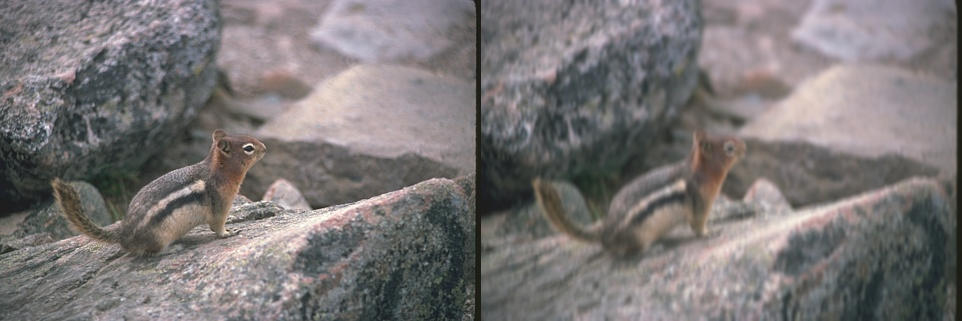

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


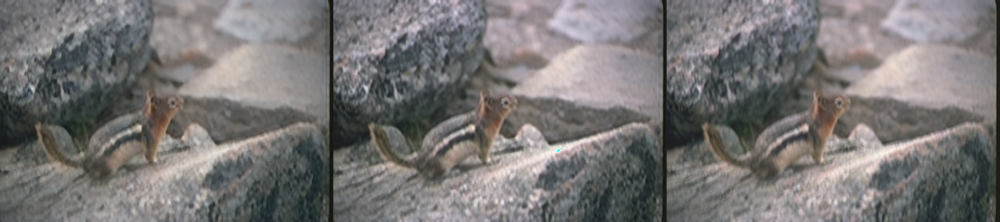

11
Orignal Image | Degraded Image


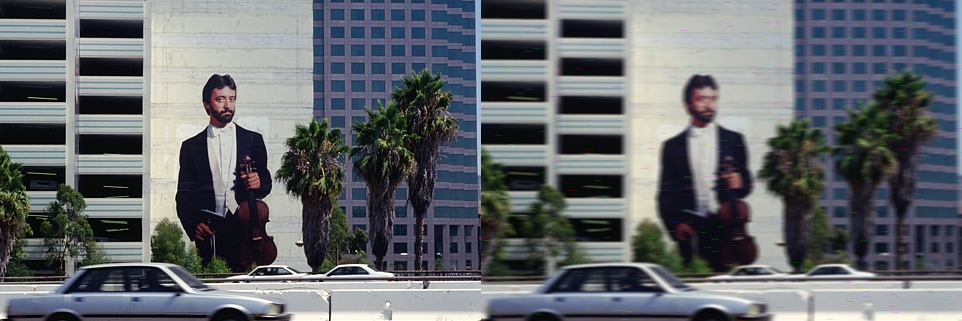

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


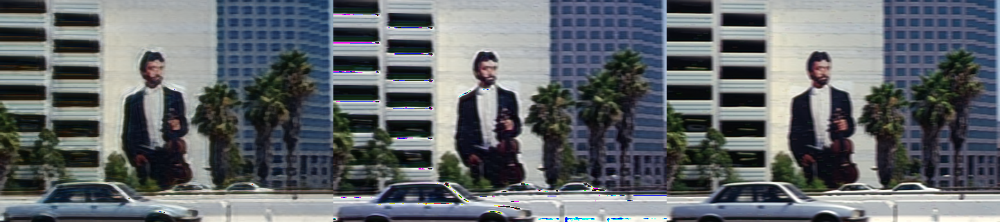

93
Orignal Image | Degraded Image


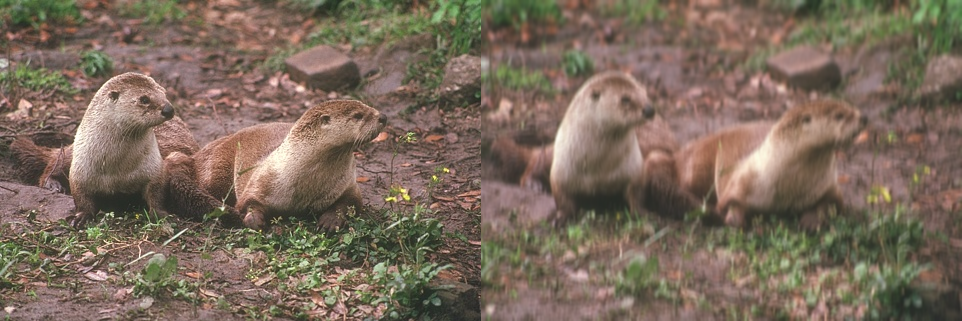

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


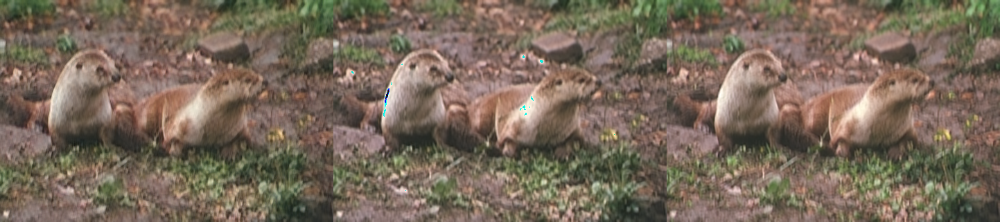

90
Orignal Image | Degraded Image


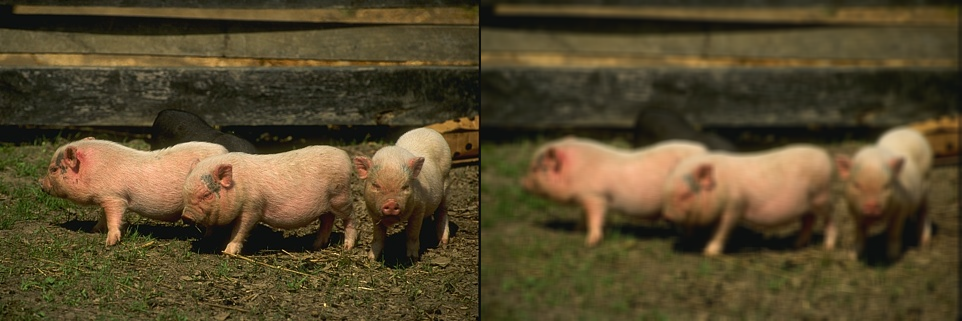

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


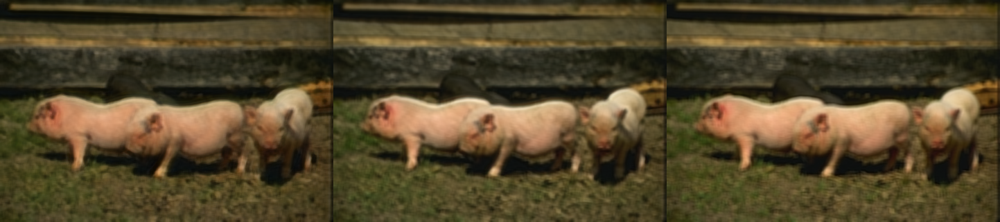

68
Orignal Image | Degraded Image


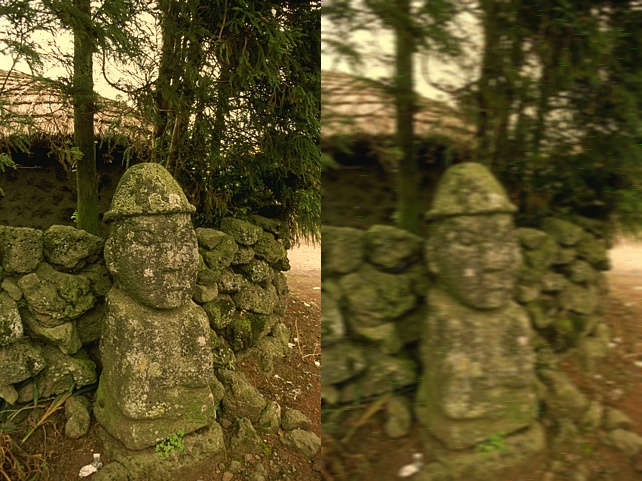

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


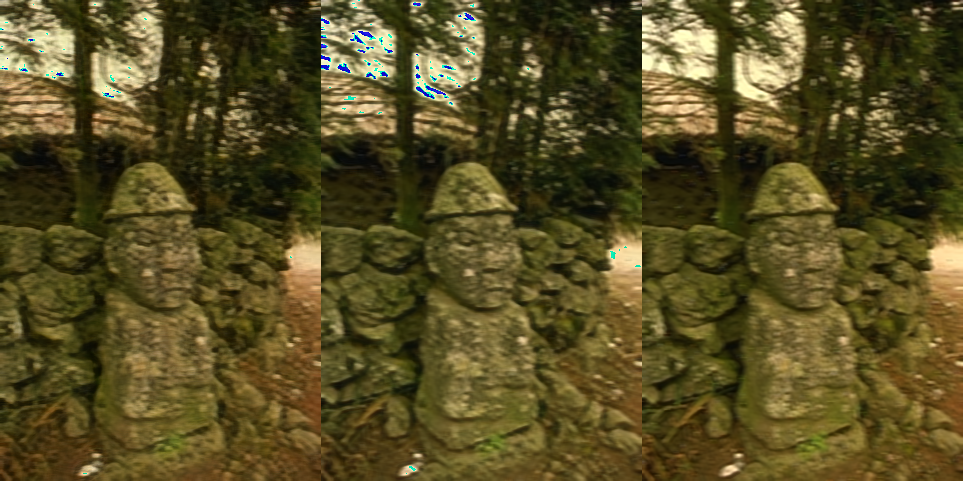

58
Orignal Image | Degraded Image


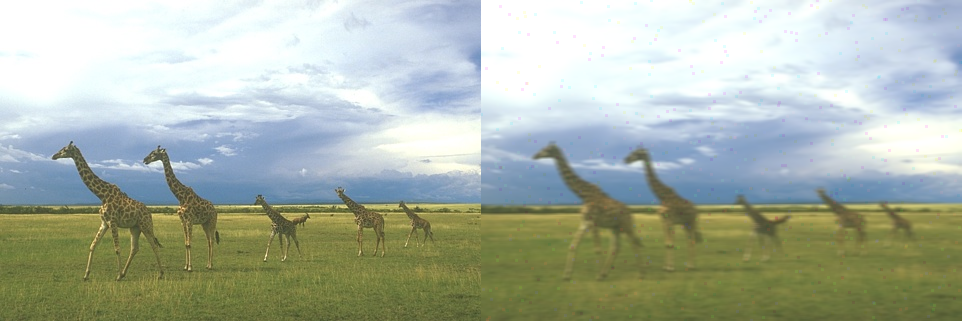

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


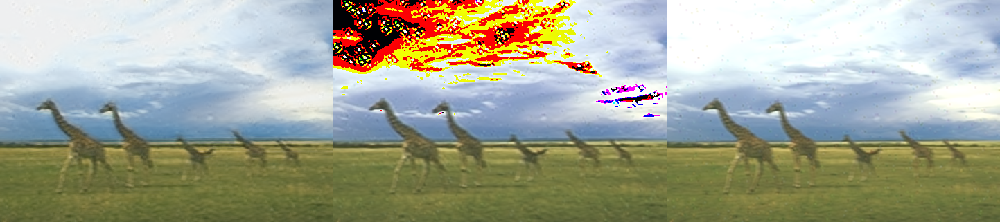

14
Orignal Image | Degraded Image


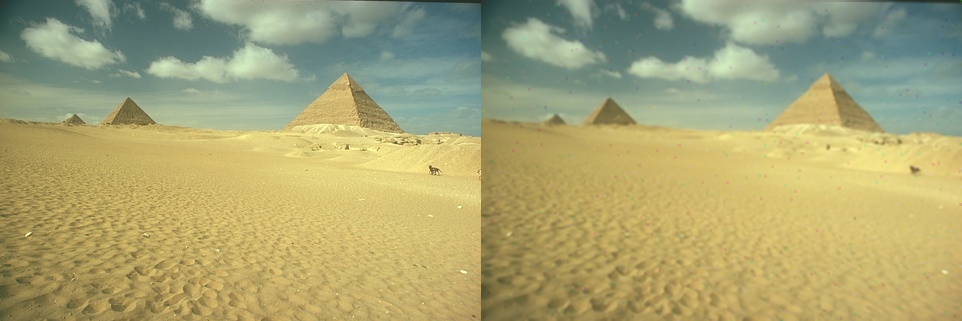

Prediction Image - 1 | Prediction Image - 2 | Prediction Image - 3


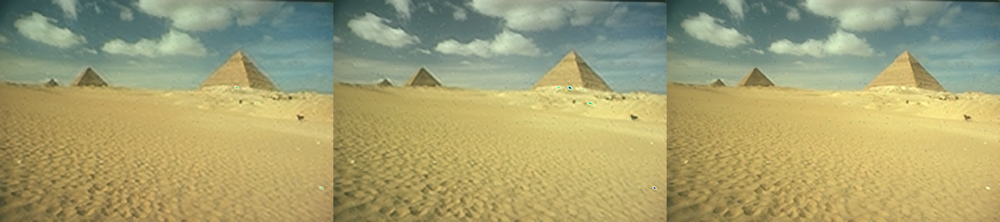

In [ ]:
for n in np.random.randint(100, size=(7)): # nth image in the directory will be read
  print(n)
  test(n)

####Other random degraded images from internet.

(1367, 2048, 3)


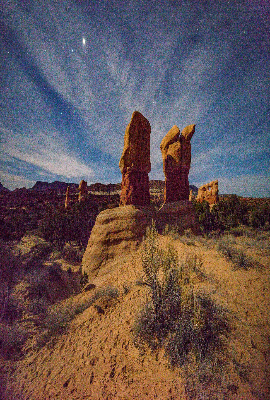

Prediction Image - 1
Prediction Image - 2
Prediction Image - 3


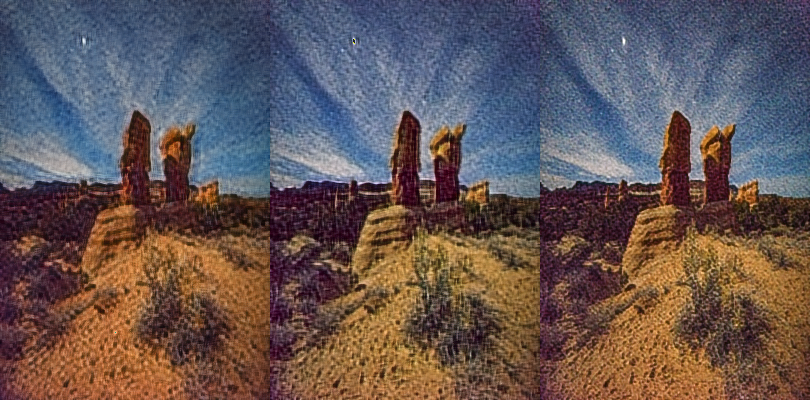

In [ ]:
n = 7 # nth image in the directory will be read

nm = "n1.jpg"
img = cv2.imread(nm) # Read image

# Display image
print(img.shape)

img = cv2.resize(img, (270, 400))

cv2_imshow(img)

print("Prediction Image - 1")
c_img0 = predict0(img)

print("Prediction Image - 2")
c_img1 = predict1(img)

print("Prediction Image - 3")
c_img2 = predict2(img)

c_img = np.concatenate((c_img0, c_img1, c_img2), axis=1)

cv2_imshow(c_img)

(183, 275, 3)


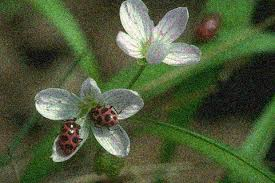

Prediction Image - 1
Prediction Image - 2
Prediction Image - 3


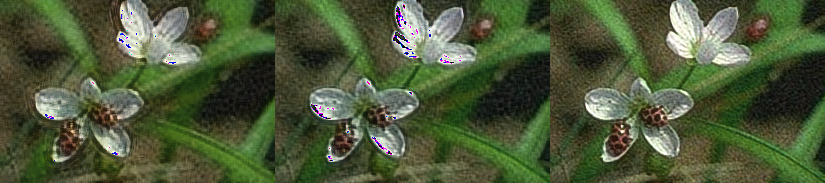

In [ ]:
nm = "n2.jpg"
img = cv2.imread(nm) # Read image

# Display image
print(img.shape)

cv2_imshow(img)

print("Prediction Image - 1")
c_img0 = predict0(img)

print("Prediction Image - 2")
c_img1 = predict1(img)

print("Prediction Image - 3")
c_img2 = predict2(img)

c_img = np.concatenate((c_img0, c_img1, c_img2), axis=1)

cv2_imshow(c_img)

(225, 225, 3)


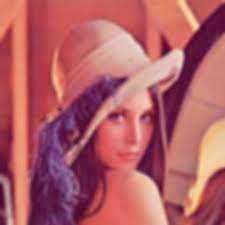

Prediction Image - 1
Prediction Image - 2
Prediction Image - 3


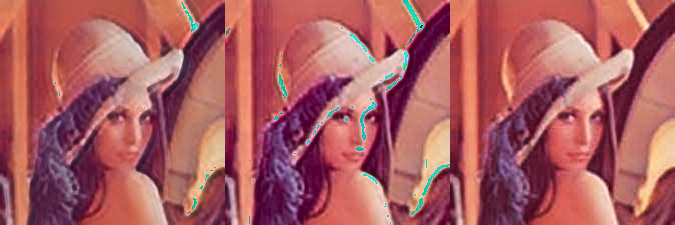

In [ ]:
nm = "n3.jpg"
img = cv2.imread(nm) # Read image

# Display image
print(img.shape)

cv2_imshow(img)

print("Prediction Image - 1")
c_img0 = predict0(img)

print("Prediction Image - 2")
c_img1 = predict1(img)

print("Prediction Image - 3")
c_img2 = predict2(img)

c_img = np.concatenate((c_img0, c_img1, c_img2), axis=1)

cv2_imshow(c_img)

##Observations and Results

I have tried in total 16 different CNN models of varying depth and with different size of patches  
I have used 3 different patch size : 27, 17, 7   
Selected 3 models giving the best testing and validation accuracy for testing images.   
Tried those 3 models on various images including from the training set, the testing set as well as sone other images on internet. The model trained on patch size 7 seems to work better than the others.

When I started it models I thought a model with small depth would work but I had to increase depth eventually to improve accuracy. But eventually the accuracy stopped increasing even after increasing depth. 

Looking at results on various images, the model with window size 7 seemingly performs better than other models.I was expecting the model with larger window size to perform better but it was not so.   
The model traind on patches of size 7 had better validation accuracy and also performed better on test images (Images predicted by that model looke better compared to other)  
This must be because usually the pixel value depends only on the value of neigbouring pixels and not by value of pixels that are far away and hance larger window size does not perform better. 




*I have mentioned the references I have used above in the code*